# EZyRB 

In this tutorial, we will explain step by step how to use the **EZyRB** library to perform a non-intrusive model order reduction (MOR) to the output of a high fidelity simulation and compare different methods of dimensionality reduction, interpolation and accuracy assessment. ([Check the documentation](https://mathlab.github.io/EZyRB/code.html))

<table><tr>
<td> <img src="logo_ezrb.png" alt="Drawing" width="300"/> </td>
<td> <img src="logo_mathlab.png" alt="Drawing" width="300"/> </td>
</tr></table>

---

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#EZyRB" data-toc-modified-id="EZyRB-1">EZyRB</a></span></li><li><span><a href="#The-dataset" data-toc-modified-id="The-dataset-2">The dataset</a></span></li><li><span><a href="#How-to-use-EZyRB?" data-toc-modified-id="How-to-use-EZyRB?-3">How to use EZyRB?</a></span><ul class="toc-item"><li><span><a href="#Step-1:-Import-the-necessary-libraries" data-toc-modified-id="Step-1:-Import-the-necessary-libraries-3.1">Step 1: Import the necessary libraries</a></span></li><li><span><a href="#Step-2:-Import-the-dataset" data-toc-modified-id="Step-2:-Import-the-dataset-3.2">Step 2: Import the dataset</a></span></li><li><span><a href="#Step-3:-Extract-snapshots-and-parameters" data-toc-modified-id="Step-3:-Extract-snapshots-and-parameters-3.3">Step 3: Extract snapshots and parameters</a></span></li><li><span><a href="#Step-4:-Sorting-snapshots-if-needed" data-toc-modified-id="Step-4:-Sorting-snapshots-if-needed-3.4">Step 4: Sorting snapshots if needed</a></span></li><li><span><a href="#Step-5:-Offline-phase" data-toc-modified-id="Step-5:-Offline-phase-3.5">Step 5: Offline phase</a></span></li><li><span><a href="#Step-6:-Online-phase" data-toc-modified-id="Step-6:-Online-phase-3.6">Step 6: Online phase</a></span></li><li><span><a href="#Step-7:-Accuracy-assessment" data-toc-modified-id="Step-7:-Accuracy-assessment-3.7">Step 7: Accuracy assessment</a></span></li></ul></li><li><span><a href="#Comparison" data-toc-modified-id="Comparison-4">Comparison</a></span><ul class="toc-item"><li><span><a href="#Reduction-methods:" data-toc-modified-id="Reduction-methods:-4.1">Reduction methods:</a></span><ul class="toc-item"><li><span><a href="#POD-methods" data-toc-modified-id="POD-methods-4.1.1">POD methods</a></span></li><li><span><a href="#AE-vs-POD" data-toc-modified-id="AE-vs-POD-4.1.2">AE vs POD</a></span></li></ul></li><li><span><a href="#Approximation-methods" data-toc-modified-id="Approximation-methods-4.2">Approximation methods</a></span><ul class="toc-item"><li><span><a href="#RBF-vs-GPR-vs-K-Neighbors-Regressor--vs-Radius-Neighbors-Regressor-vs-Linear--interpolator" data-toc-modified-id="RBF-vs-GPR-vs-K-Neighbors-Regressor--vs-Radius-Neighbors-Regressor-vs-Linear--interpolator-4.2.1">RBF vs GPR vs K-Neighbors Regressor  vs Radius Neighbors Regressor vs Linear  interpolator</a></span></li><li><span><a href="#RBF-vs-ANN" data-toc-modified-id="RBF-vs-ANN-4.2.2">RBF vs ANN</a></span></li></ul></li></ul></li></ul></div>

<a id='NS_dataset'></a> 
# The dataset 

We will be using the **Navier Stokes Dataset** that contains the output data from a full order flow simulation and can be found on **GitHub** under [Smithers library](https://github.com/mathLab/Smithers).

**Smithers** is created by **SISSA mathlab** and it contains some useful datasets and a multi-purpose toolbox that inherits functionality from other packages to make the process of dealing with these datasets much easier with more compact coding.

The package can be installed using:
   
`python -m pip install smithers -U`

**Importing the dataset:**

In the following steps we will import the dataset and explore the `NavierStokesDataset()` class:
- .snapshots
- .params
- .pts_coordinates
- .faces
- .triang 

In [1]:
from smithers.dataset import NavierStokesDataset
data = NavierStokesDataset()

**Exploring the snapshots:**

In the following cells we will find that `data.snapshots` returns a dictionary with 4 keys (physical properties) which are:
- **vx:** velocity in the X-direction. 
- **vy:** velocity in the Y-direction. 
- **mag(v):** velocity magnitude.
- **p:** pressure value.

For each physical property (key) there is a 2-D array of the shape (500,1639):
- Each row of the 500 represents a snapshot.
- Each snapshot/row contains the values of a particular physical property at 1639 nodes/elements (since the data is from FE analysis).

In [2]:
type(data.snapshots)

dict

In [3]:
len(data.snapshots)

4

In [4]:
data.snapshots.keys()

dict_keys(['vx', 'vy', 'mag(v)', 'p'])

In [5]:
type(data.snapshots['vx'])

numpy.ndarray

In [6]:
data.snapshots['vx'].shape

(500, 1639)

**Exploring the parameters:**

We can see below that `data.params` returns a 2-D array of the shape (500,1).

We have only one parameter which is the **Time step** of the analysis that corresponds to 500 snapshots. 

In [7]:
type(data.params)

numpy.ndarray

In [8]:
data.params.shape

(500, 1)

**Exploring the coordinates of the points:**

We can understand from below that this data is the result of a 2-D finite element simulation (2 rows = 2 coordinates) with 1639 elements/points. 

In [9]:
type(data.pts_coordinates)

numpy.ndarray

In [10]:
data.pts_coordinates.shape

(2, 1639)

**Exploring the points cells:**

We can see here that we have 3091 cells, where each cell is composed of 3 points (triangular cells).

By having:
1. `data.faces` --> For each triangle, they are the indices of the three points that make up the triangle.
2. `data.pts_coordinates` --> X and Y coordinates of the grid points.

We can construct the triangular grid: `Triangulation(x, y, triangles=data.faces)`

In this case, thanks to **Smithers**, we can call the triangular grid directly using `data.triang`

In [11]:
type(data.faces)

numpy.ndarray

In [12]:
data.faces.shape

(3091, 3)

In [13]:
type(data.triang)

matplotlib.tri.triangulation.Triangulation

# How to use EZyRB?

## Step 1: Import the necessary libraries

First of all, we import the required packages.

From `EZyRB` we need:
1. The `ROM` class, which performs the model order reduction process.
2. A module such as `Database`, where the matrices of snapshots and parameters are stored. 
3. A dimensionality reduction method such as Proper Orthogonal Decomposition `POD` or Auto-Encoder network `AE`.
4. An interpolation method to obtain an approximation for the parametric solution for a new set of parameters such as the Radial Basis Function `RBF`, Gaussian Process Regression `GPR`,  K-Neighbors Regressor `KNeighborsRegressor`,  Radius Neighbors Regressor `RadiusNeighborsRegressor` or Multidimensional Linear Interpolator `Linear`.

We also need to import:
* `numpy:` to handle arrays and matrices we will be working with.
* `torch:` to enable the usage of Neural Networks
* `matplotlib.pyplot:` to handle the plotting environment. 
* `matplotlib.tri:` for plotting of the triangular grid.

In [14]:
# Database module
from ezyrb import Database

# Dimensionality reduction methods
from ezyrb import POD, AE

# Approximation/interpolation methods
from ezyrb import RBF, GPR, KNeighborsRegressor, RadiusNeighborsRegressor, Linear, ANN

# Model order reduction calss
from ezyrb import ReducedOrderModel as ROM

import numpy as np
import torch
import torch.nn as nn

import matplotlib.tri as mtri
import matplotlib.pyplot as plt
%matplotlib inline

## Step 2: Import the dataset

[Here we import the data set we explored above.](#NS_dataset)

In [15]:
from smithers.dataset import NavierStokesDataset
data = NavierStokesDataset()

## Step 3: Extract snapshots and parameters

Make sure that snapshots are represented by rows.

In [16]:
snapshots_vx = data.snapshots['vx']
snapshots_vy = data.snapshots['vy']
snapshots_magv = data.snapshots['mag(v)']
snapshots_p = data.snapshots['p']

param = data.params

triang = data.triang

In [17]:
print('Snapshots matrices: \
      \n Velocity in the X-direction: {} \
      \n Velocity in the Y-direction: {} \
      \n Velocity magnitude: {} \
      \n Pressure: {} \
      \n\nParameters matrix: \
      \n Time step: {} \
      '.format(snapshots_vx.shape, snapshots_vy.shape, snapshots_magv.shape, snapshots_p.shape, param.shape))

Snapshots matrices:       
 Velocity in the X-direction: (500, 1639)       
 Velocity in the Y-direction: (500, 1639)       
 Velocity magnitude: (500, 1639)       
 Pressure: (500, 1639)       

Parameters matrix:       
 Time step: (500, 1)       


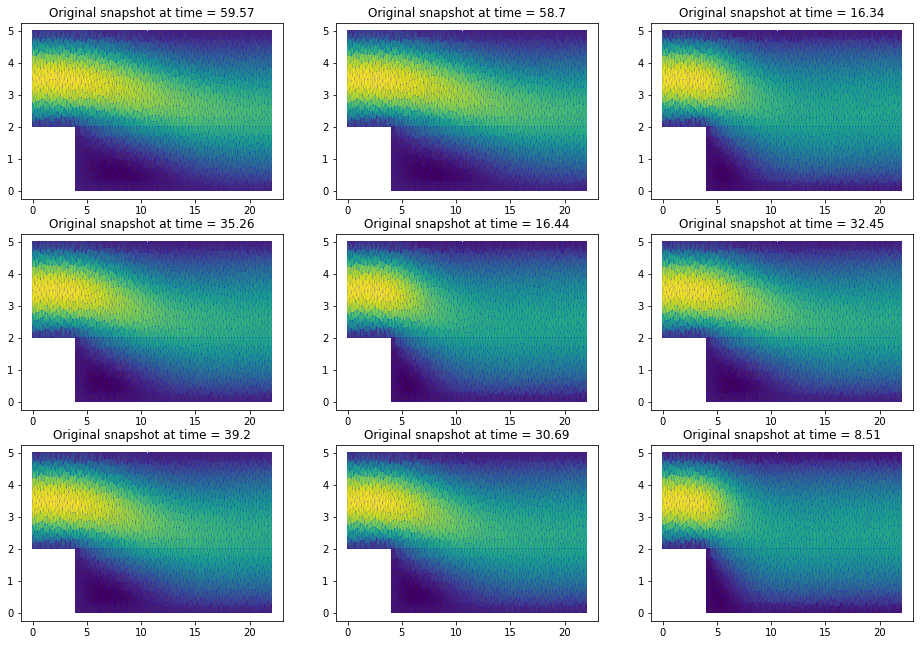

In [18]:
# Visualising 9 of 500 snapshots (0, 60, 120, 180, 240, 300, 360, 420, 480)
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(16, 11))
ax = ax.flatten()
j = 0 
for i in range(9):
    ax[i].triplot(triang, 'b-', lw=0.1)
    ax[i].tripcolor(triang, snapshots_vx[j])
    ax[i].set_title('Original snapshot at time = {}'.format(*param[j].round(2)))
    j += 60

## Step 4: Sorting snapshots if needed

In this case, the only parameter we have is the "Time step" and we can see from the cell above that the snapshots are not sorted with respect to the "Time step".

So, in the next step, we sort the snapshots according to the "Time step" parameter.

In [19]:
import pandas as pd
sorting_indices = pd.DataFrame(param, index=range(500), columns=['Time']).sort_values('Time',inplace= False).index

snapshots_vx = snapshots_vx[sorting_indices]
snapshots_vy = snapshots_vy[sorting_indices]
snapshots_magv = snapshots_magv[sorting_indices]
snapshots_p = snapshots_p[sorting_indices]

param = param[sorting_indices] 

Check the maximum and minimum of the "Time step" parameter:

In [20]:
print('Start time = {}\nEnd time = {}'.format(param.min(),param.max()))

Start time = 1.044841627758571
End time = 79.98751719614785


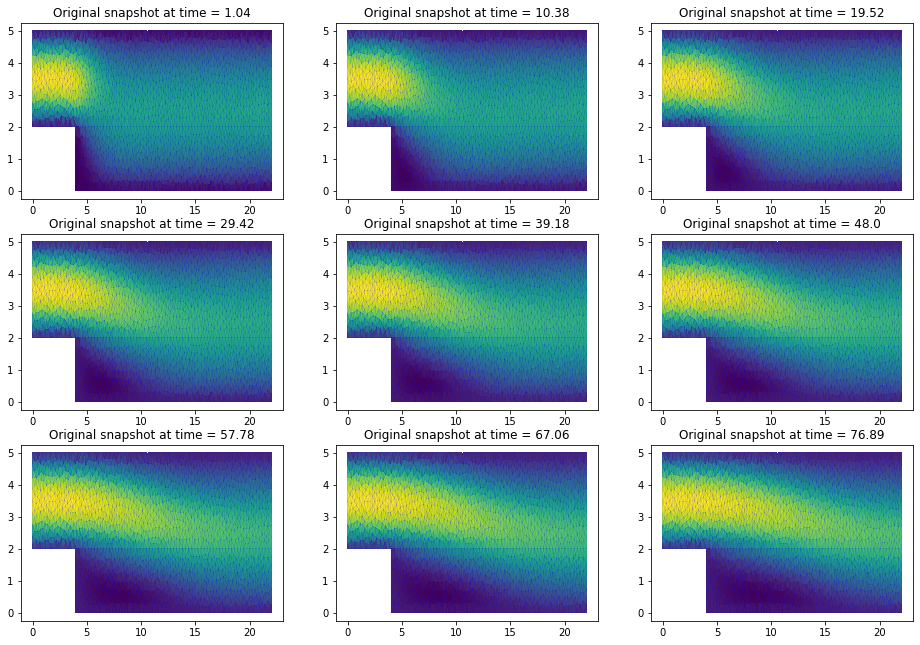

In [21]:
# Visualising 9 of 500 snapshots (0, 60, 120, 180, 240, 300, 360, 420, 480)
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(16, 11))
ax = ax.flatten()
j = 0 
for i in range(9):
    ax[i].triplot(triang, 'b-', lw=0.1)
    ax[i].tripcolor(triang, snapshots_vx[j])
    ax[i].set_title('Original snapshot at time = {}'.format(*param[j].round(2)))
    j += 60

## Step 5: Offline phase

In this step, we perform the model order reduction to obtain a reduced space from the full order space.

1. We start by passing the matrices of the parameters and snapshots to the `Database()` class. In this example, the matrix of snapshots `snapshots_vx` is used, but feel free to try using 
`snapshots_vy`, `snapshots_magv` or `snapshots_p` alternatively.


2. As a dimensionality reduction method, we use a discreet version of the  Proper Orthogonal Decomposition `POD('svd')` that relay on Singular Value Decomposition. Comparison between other **reduction methods** is mentioned [here](#Reduction_methods).

3. For solution approximation, we create an instance of the Radial Basis Function class `RBF()` to be used as a multidimensional interpolator. Comparison between other **approximation methods** is mentioned [here](#Approximation_methods).



4. We instantiate the Reduced Order Model class `ROM()` by passing the created instances of `Database()`, `POD()` and  `RBF()`


5. By using the `ReducedOrderModel.fit()` method:
    1. The reduced space is computed.
    2. The original snapshots in the database (full order space) are projected onto the POD space (reduced space).
    3. The RBF interpolator is created.

In [22]:
import warnings
warnings.filterwarnings("ignore", message="Ill-conditioned matrix ")
# To ignore this warning (path\anaconda3\lib\site-packages\scipy\interpolate\rbf.py:266: LinAlgWarning:Ill-conditioned matrix (rcond=3.35532e-19): result may not be accurate.)

In [23]:
db = Database(param, snapshots_vx)
pod = POD('svd')
rbf = RBF()
rom = ROM(db, pod, rbf)
rom.fit()

## Step 6: Online phase

In this step, we predict the solution for a new set of parameters that do not exist in the original parameter database.   

We use `ReducedOrderModel.predict()` and pass the new parameters (new time steps in this case) `new_ts`.

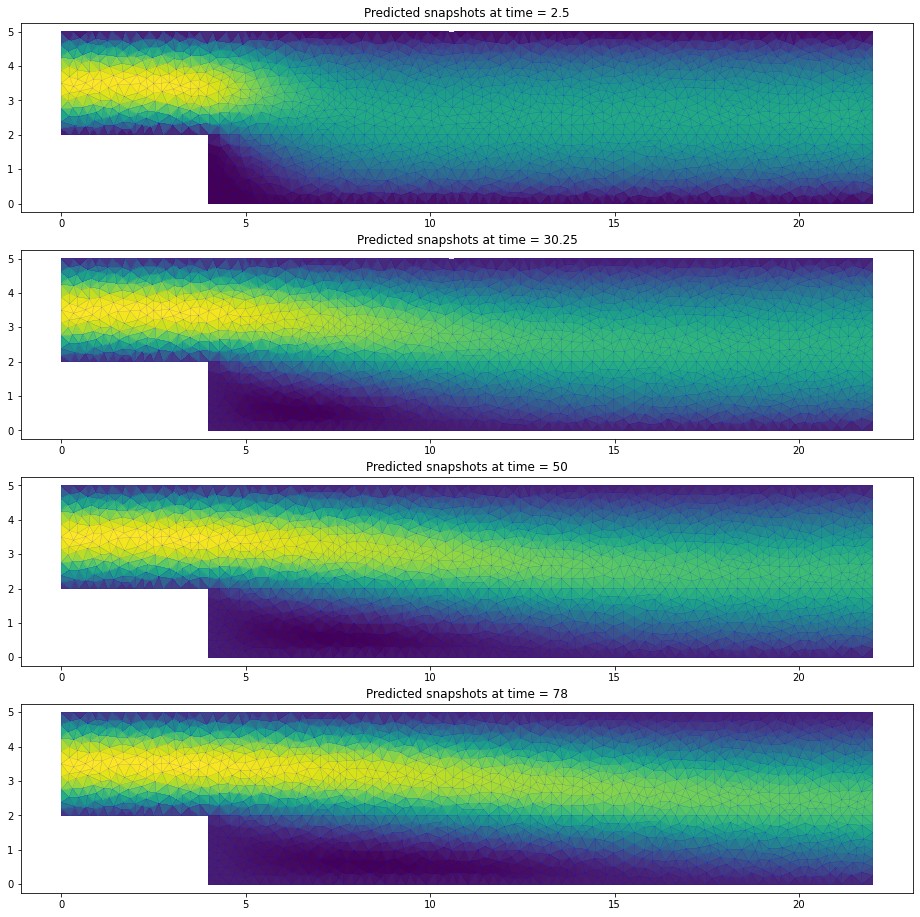

In [24]:
new_ts = [2.5, 30.25, 50, 78]

fig, ax = plt.subplots(nrows=len(new_ts), ncols=1, figsize=(16, 4*len(new_ts)))
ax = ax.flatten()

for i in range(len(new_ts)):
    ax[i].triplot(triang, 'b-', lw=0.1)
    ax[i].tripcolor(triang, rom.predict([new_ts[i]]))
    ax[i].set_title('Predicted snapshots at time = {}'.format(new_ts[i]))

## Step 7: Accuracy assessment

In this step, we are calculating the approximation error to see how close is our reduced solution to the full-order solution/simulation using the **k-fold Cross-Validation** strategy by passing the number of splits to the `ReducedOrderModel.kfold_cv_error(n_splits)` method, which operates as follows: 

1. Split the dataset (parameters/snapshots) into $k$-number of groups/folds.
2. Use $k-1$ groups to calculate the reduced space and leave one group for testing.
3. Use the approximation/interpolation method to predict each snapshot in the testing group.
4. Calculate the error for each snapshot in the testing group by taking the difference between the predicted and the original snapshot. 
5. Average the errors for predicting snapshots of the testing group/fold.
6. Repeat this procedure using different groups for testing and the remaining $k-1$ groups to calculate the reduced space.
7. In the end, we will have $k$-number errors for predicting each group/fold that we can average them to have one value for the error.

In [25]:
errors = rom.kfold_cv_error(n_splits = 5)
print('Average error for each fold:')
for e in errors:
    print('  ',e)
print('\nAverage error = {}'.format(errors.mean()))

Average error for each fold:
   6.611566263233958
   0.008873281479245562
   0.004104979704346041
   0.002581356466075108
   0.027432331873883622

Average error = 1.3309116425515017


In [26]:
errors = rom.kfold_cv_error(n_splits = 10)
print('Average error for each fold:')
for e in errors:
    print('  ',e)
print('\nAverage error = {}'.format(errors.mean()))

Average error for each fold:
   3.2946594824452364
   0.008822380800359584
   0.002803222289585017
   0.0016069867401989606
   0.0009221904822059524
   0.0009785022372391598
   0.0006868185221125535
   0.00040781013713536756
   0.0004467976508637389
   0.01239338432504866

Average error = 0.33237275756299856


**Note:** We notice that by increasing the number of folds/splits we perform more tests, obtain better accuracy, smaller average error and also consume more computational time.

Another strategy for calculating the approximation error is called **leave-one-out** by using the  `ReducedOrderModel.loo_error()` method, which is similar to setting the number of folds equal to the number of snapshots (Ex. In this case setting n_splits = 500) and it operates as follows:
1. Combine all the snapshots except one.
2. Calculate the reduced space.
3. Use the approximation/interpolation method to predict the removed snapshot.
4. Calculate the error by taking the difference between the predicted snapshot and the original removed one.
5. The error vector is obtained by repeating this procedure for each snapshot in the database.

It is worth mentioning that it consumes more time because we have 500 snapshots and the algorithm will perform space order reduction and calculate the approximation error 500 times.

In [27]:
errors = rom.loo_error()

In [28]:
print('Parameter (Time step)','|', 'Approximation error for each snapshot')
for pt, e in zip(rom.database.parameters, errors):
    print('{:.3f}'.format(*pt),'                 ', '{:.6f}'.format(e))

Parameter (Time step) | Approximation error for each snapshot
1.045                   0.202319
1.082                   0.065583
1.115                   0.084758
1.463                   0.010403
1.503                   0.003139
1.533                   0.003709
1.680                   0.007583
1.851                   0.002677
1.956                   0.000769
2.057                   0.000597
2.243                   0.000006
2.252                   0.000005
2.348                   0.000009
2.384                   0.000006
2.410                   0.000015
2.612                   0.000271
2.714                   0.000331
2.934                   0.000008
2.950                   0.000004
2.979                   0.000008
3.103                   0.000003
3.126                   0.000010
3.266                   0.000281
3.416                   0.000842
3.605                   0.001938
3.845                   0.005801
4.226                   0.000200
4.255                   0.000105
4.392         

42.630                   0.000484
42.793                   0.000100
42.869                   0.000047
42.901                   0.000097
43.354                   0.000017
43.363                   0.000013
43.456                   0.000016
43.492                   0.000010
43.650                   0.000035
43.703                   0.000018
43.762                   0.000072
43.977                   0.000027
44.028                   0.000204
44.374                   0.000899
44.510                   0.000061
44.643                   0.000217
44.812                   0.000021
44.862                   0.000005
44.912                   0.000021
45.080                   0.000423
45.293                   0.000776
45.500                   0.000029
45.534                   0.000099
45.861                   0.000659
46.004                   0.000014
46.058                   0.000006
46.182                   0.000449
46.514                   0.000009
46.530                   0.000005
46.561        

In [29]:
print('Average error = {}'.format(errors.mean()))

Average error = 0.003992972610733166


Finding the parametric points where new high-fidelity solutions have to be computed in order to globally reduce the estimated error and improve accuracy; can be done by using `ReducedOrderModel.optimal_mu(error, k)` method and passing the estimated error evaluated for each snapshot as an array and the number of optimal points to return.

By default, it uses the leave-one-out error.

These points are the barycentric centre of the regions (simplex) with higher error.

In [30]:
rom.optimal_mu(errors)

ValueError: Need at least 2-D data

In [30]:
# .

# Comparison

In [31]:
# =======================================
# Repeated steps (done before)
# Step 1: Import the necessary libraries
# Step 2: Import the dataset
# Step 3: Extract snapshots and parameters
# Step 4: Sorting snapshots if needed
print('Parameters matrix size: {}\nSnapshots matrix size: {}'.format(param.shape, snapshots_vx.shape))

# =======================================
# Graphical representation (original vs predicted) snapshots
def visual_test(triang, rom, index, fig_title, fig_name):
    fig, axs = plt.subplots(2, figsize=(16, 8))
    fig.suptitle(fig_title, fontsize=25, fontweight='bold')
    # Original
    axs[0].triplot(triang, 'b-', lw=0.1)
    axs[0].tripcolor(triang, snapshots_vx[index]); # snapshots_vx[index] = rom.database.snapshots[index]
    axs[0].set_title('Original snapshots at time ={}'.format(*param[index].round(2))) # param[index] = rom.database.parameters[index]
    # Predicted
    axs[1].triplot(triang, 'b-', lw=0.1)
    axs[1].tripcolor(triang, rom.predict(param[index]));
    axs[1].set_title('Predicted snapshots at time = {}'.format(*param[index].round(2)))

    fig.savefig(fig_name)
    plt.show()

Parameters matrix size: (500, 1)
Snapshots matrix size: (500, 1639)


<a id = 'Reduction_methods'></a>  
## Reduction methods:


### POD methods

Here we compare the usage of three different methods of Proper Orthogonal Decomposition for dimensionality reduction:
1. `POD('svd')`: Truncated Singular Value Decomposition.
2. `POD('randomized_svd')`: Truncated Randomized Singular Value Decomposition.
3. `POD('correlation_matrix')`: Truncated Singular Value Decomposition via correlation matrix. 

For more information check the documentation [here](https://mathlab.github.io/EZyRB/code.html).

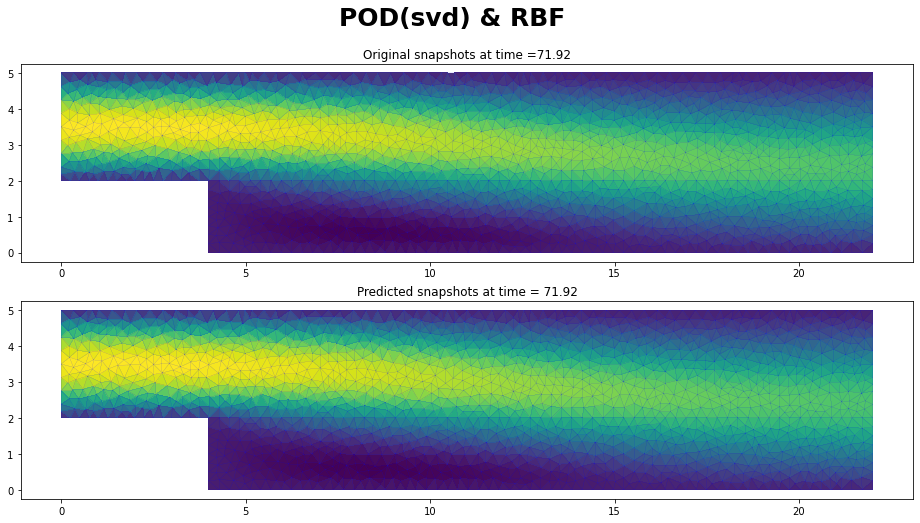

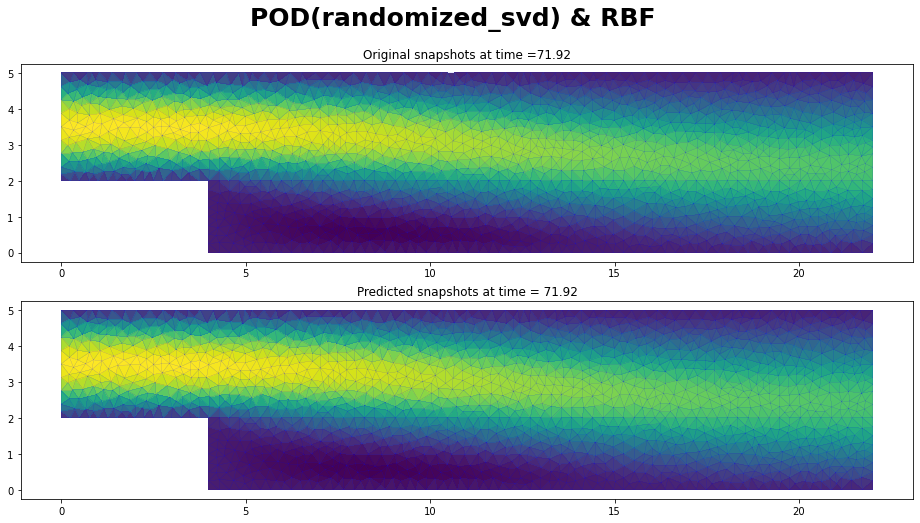

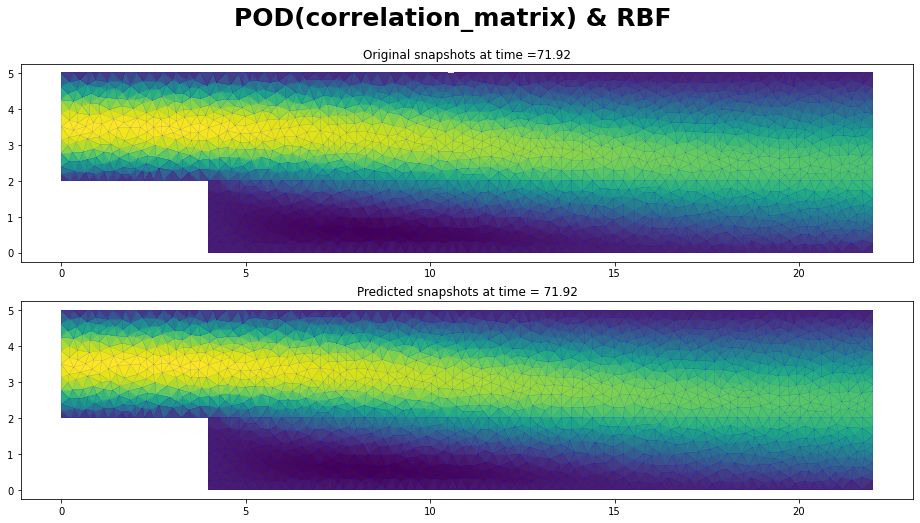

In [32]:
# =======================================
# Variables declaration
errors_list = []
POD_type = ['svd', 'randomized_svd', 'correlation_matrix']
fig_title = ['POD(svd) & RBF', 'POD(randomized_svd) & RBF', 'POD(correlation_matrix) & RBF']
fig_name = [i+'.png' for i in fig_title]
index = 450
# =======================================
for i in range(len(POD_type)):
    # Step 5: Offline phase  
    db = Database(param, snapshots_vx)
    pod = POD(POD_type[i])
    rbf = RBF()
    rom = ROM(db, pod, rbf)
    rom.fit()
    
    # Step 6: Online phase
    visual_test(triang, rom, index, fig_title[i], fig_name[i])
    
    # Step 7: Accuracy assessment
    errors = rom.kfold_cv_error(n_splits = 5)
    errors_list.append(errors.mean())

In [33]:
for i in range(len(fig_title)):
    print('Average error using "{}" = {}'.format(fig_title[i], errors_list[i]))

Average error using "POD(svd) & RBF" = 1.3309116425515017
Average error using "POD(randomized_svd) & RBF" = 1.3309116425515486
Average error using "POD(correlation_matrix) & RBF" = 1.3309120917619797


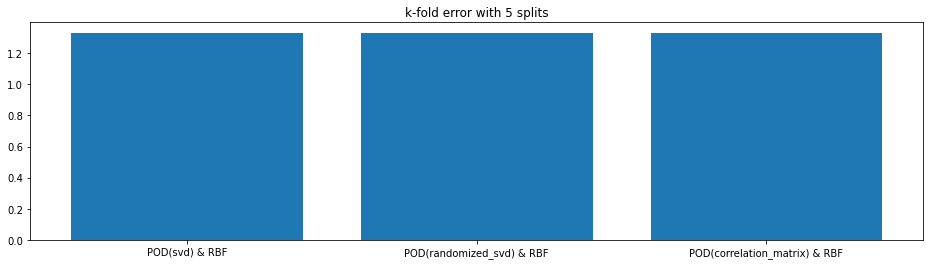

In [34]:
plt.figure(figsize=(16,4))
plt.title('k-fold error with 5 splits')
plt.bar(fig_title,errors_list)
plt.show()

**Comment:** In this particular case the error are almost the same.

### AE vs POD

Here we compare the usage of the Feed-Forward Auto-Encoder `AE` against the Proper Orthogonal Decomposition `POD('svd')` for dimensionality reduction.

For the sake of of illustration we will only remove one snapshot from the dataset and try to predict it and calculate the approximation error. We will also compare the approximation error for different sizes of the AE latent space and different rank of the SVD.

For more information check the documentation [here](https://mathlab.github.io/EZyRB/code.html).

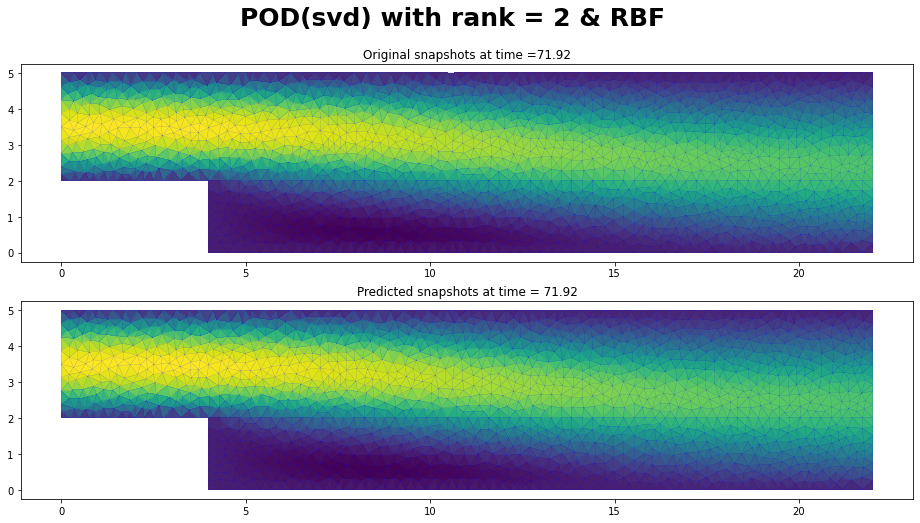

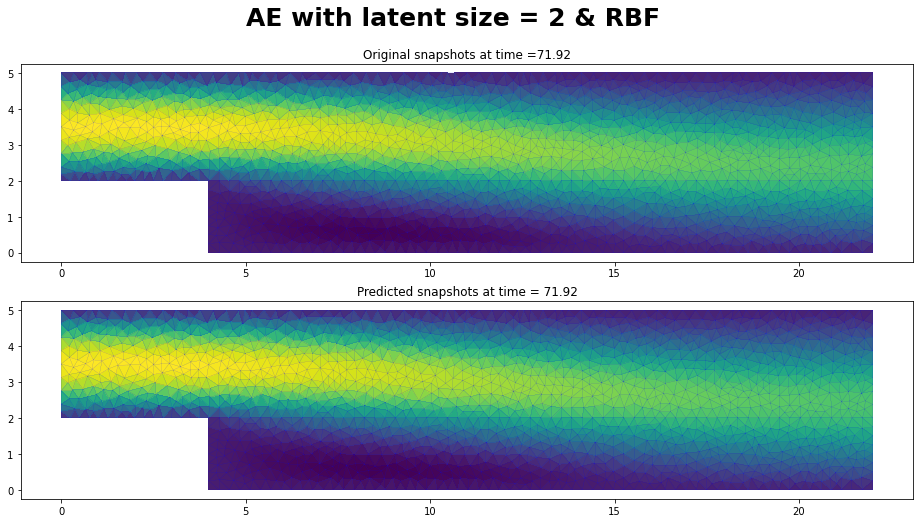

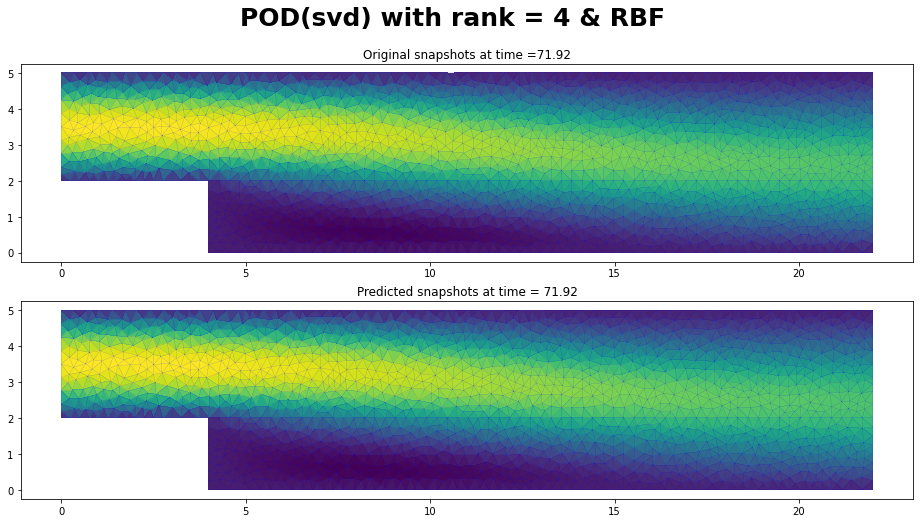

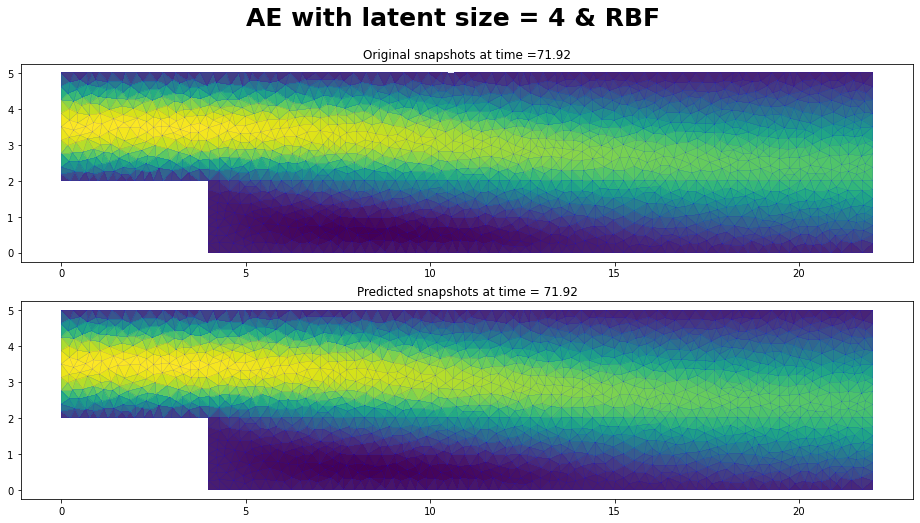

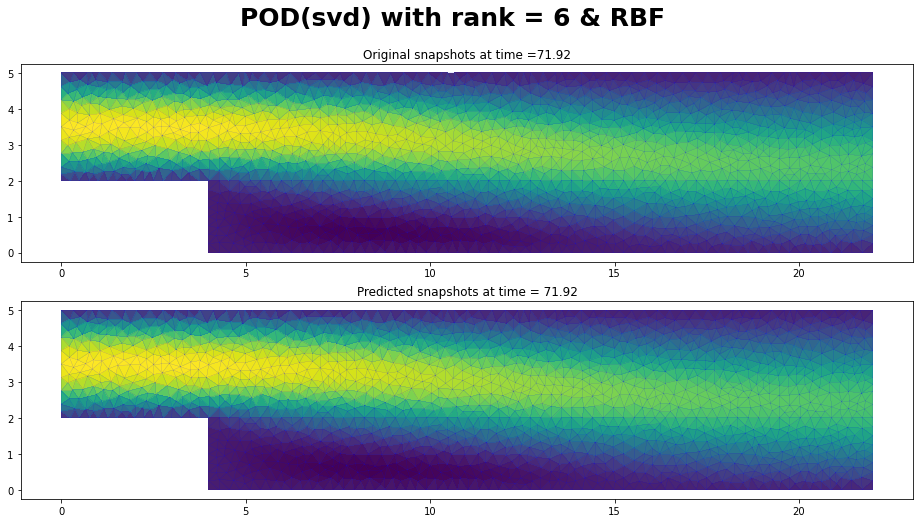

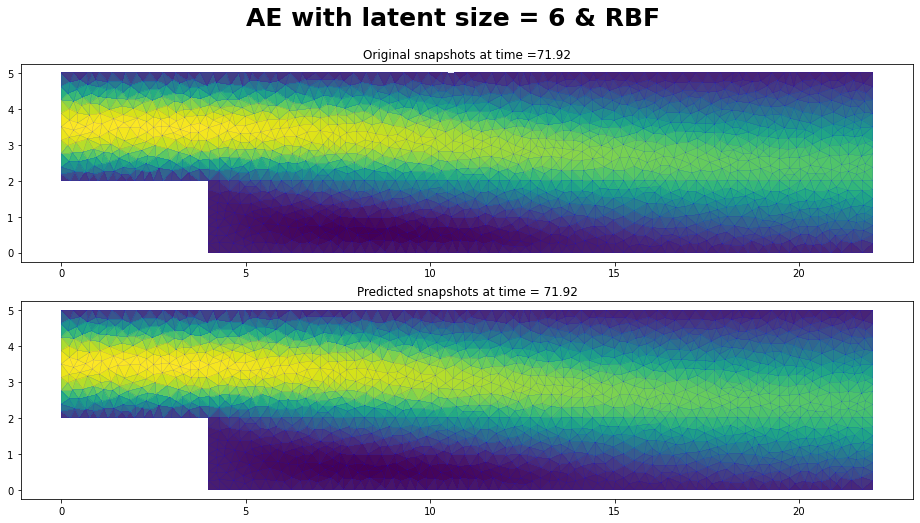

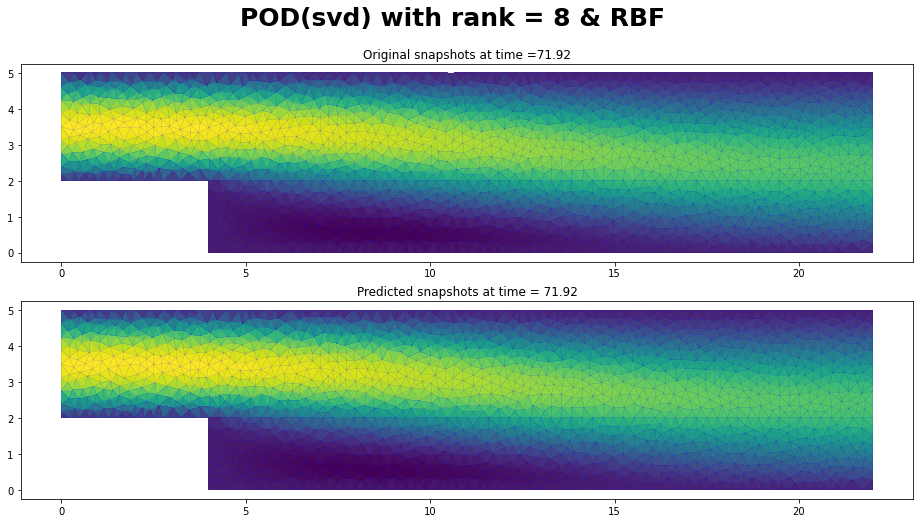

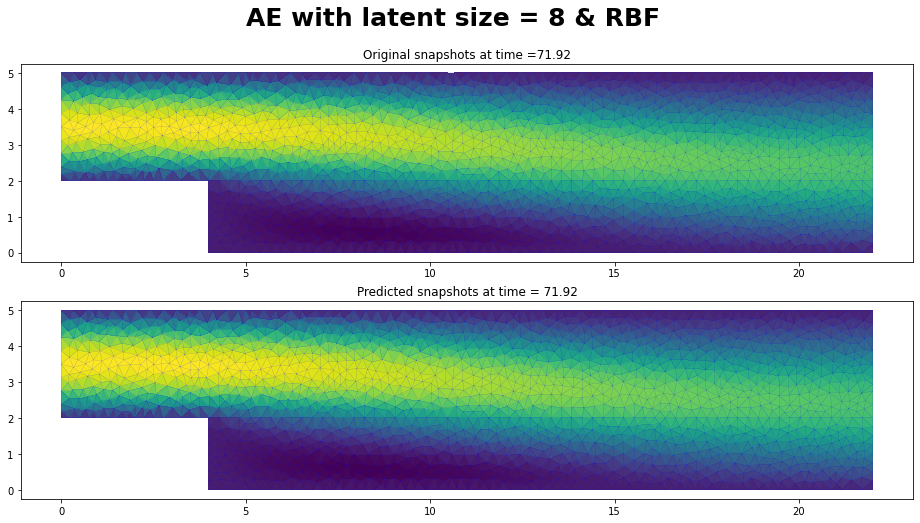

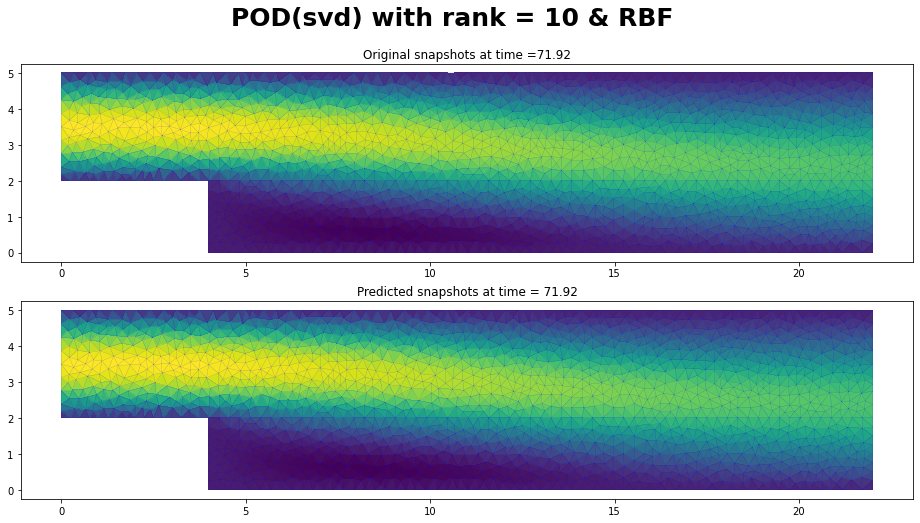

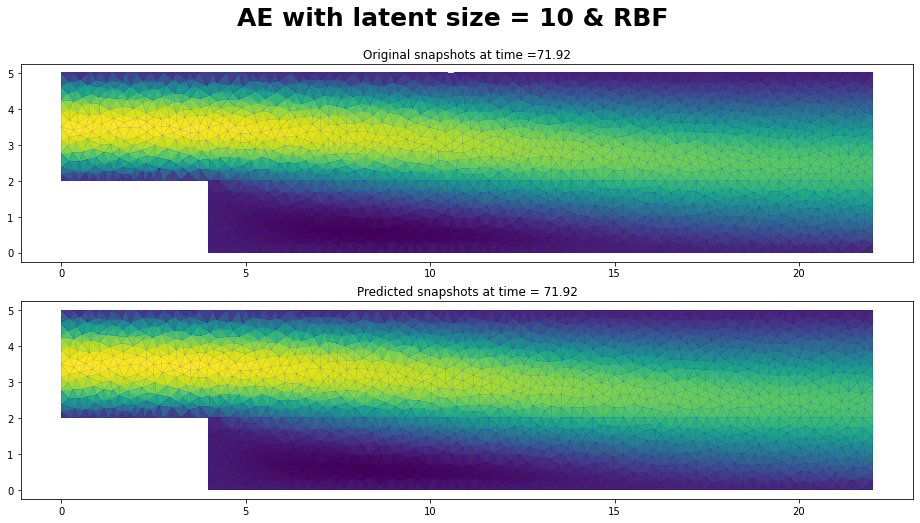

In [35]:
# =======================================
# Variables declaration
lv_dim = [2,4,6,8,10]
error_pod = []
error_ae = []
# Remove a snapshot/parameter from the training set and use it for prediction
index = 450
snapshots_vx_train = np.delete(snapshots_vx, index, 0)
param_train = np.delete(param, index, 0)

# =======================================
for j in lv_dim:
    # Step 5: Offline phase  
    db = Database(param_train, snapshots_vx_train)
    
    pod = POD('svd',rank=j)
    ae = AE([500,100,j],[j,100,500],nn.Tanh(),nn.Tanh(),8000,optimizer=torch.optim.Adam,lr=1e-4)
    
    rbf_pod = RBF()
    rbf_ae = RBF()
    
    rom_pod = ROM(db, pod, rbf_pod)
    rom_ae = ROM(db, ae, rbf_ae)

    rom_pod.fit()
    rom_ae.fit()

    # Step 6: Online phase
    fig_title = ['POD(svd) with rank = {} & RBF'.format(j), 'AE with latent size = {} & RBF'.format(j)]
    fig_name = ['SVD (rank = {}).png'.format(j), 'AE (latent size = {}).png'.format(j)]
    visual_test(triang, rom_pod, index, fig_title[0], fig_name[0])
    visual_test(triang, rom_ae, index, fig_title[1], fig_name[1])

    # Step 7: Accuracy assessment (error for predicting the one removed snapshot)
    error_podi = np.linalg.norm(rom_pod.predict(param[index])-snapshots_vx[index])/np.linalg.norm(snapshots_vx[index])
    error_aei = np.linalg.norm(rom_ae.predict(param[index])-snapshots_vx[index])/np.linalg.norm(snapshots_vx[index])
    error_pod.append(error_podi)
    error_ae.append(error_aei)

error_pod = np.array(error_pod)
error_ae = np.array(error_ae)
np.save('error_pod_1.npy',error_pod)
np.save('error_ae_1.npy',error_ae)

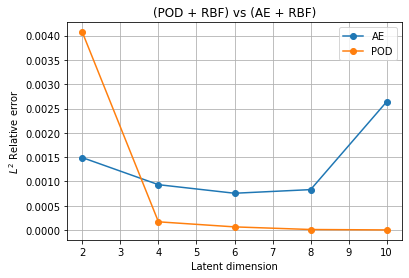

In [36]:
plt.plot(lv_dim, error_pod,'-o', label = "POD")
plt.plot(lv_dim, error_ae, '-o', label = "AE")
plt.title('(POD + RBF) vs (AE + RBF)')
plt.xlabel('Latent dimension')
plt.ylabel('$L^{2}$ Relative error')
plt.legend()
plt.grid(True)
plt.savefig('(POD + RBF) vs (AE + RBF).png')
plt.show()

<a id = 'Approximation_methods'></a>
## Approximation methods

Here we compare the usage of different methods for interpolating/approximating the solution for new parametric points:
1. `RBF()`: Radial Basis Function interpolation.
2. `GPR()`: Gaussian Process Regression.
3. `KNeighborsRegressor()`: K-Neighbors Regression.
4. `RadiusNeighborsRegressor()`: Radius Neighbors Regression.
5. `Linear()`: Multidimensional linear interpolation.

For more information check the documentation [here](https://mathlab.github.io/EZyRB/code.html).

### RBF vs GPR vs K-Neighbors Regressor  vs Radius Neighbors Regressor vs Linear  interpolator

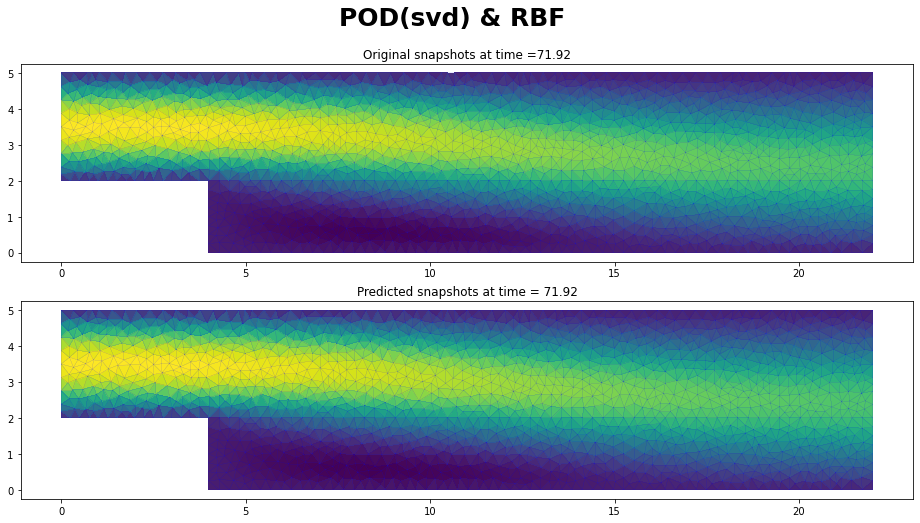

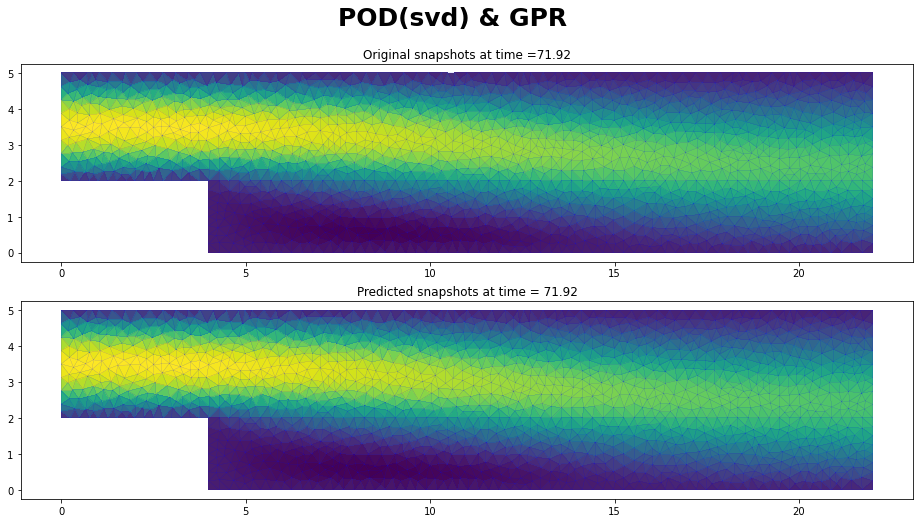

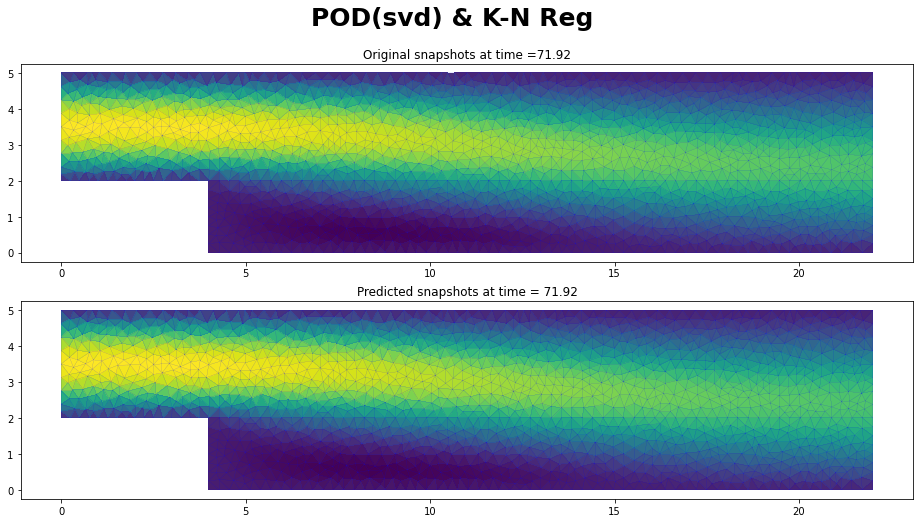

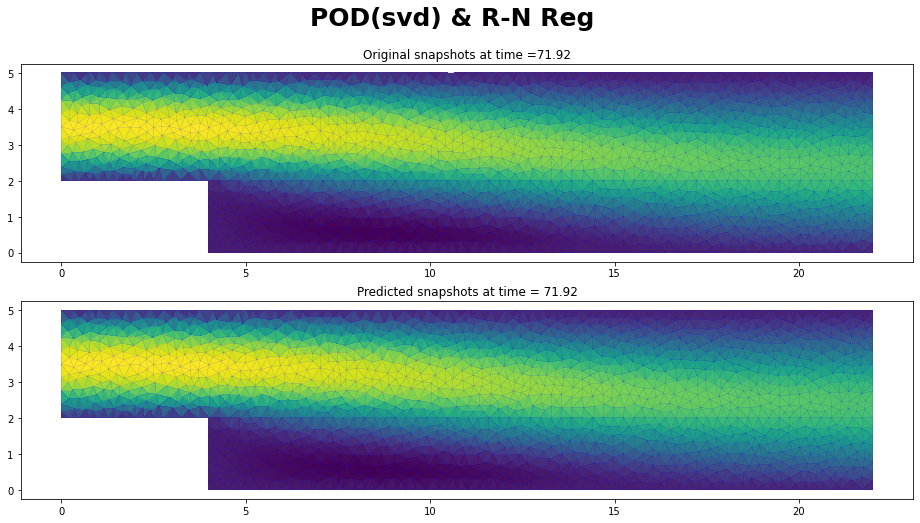

 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.
 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.
 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.
 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.
 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.


In [37]:
# =======================================
# Variables declaration
errors_list = []
Approx_type = [RBF(), GPR(), KNeighborsRegressor(), RadiusNeighborsRegressor()]#, Linear()]
fig_title = ['POD(svd) & RBF', 'POD(svd) & GPR', 'POD(svd) & K-N Reg','POD(svd) & R-N Reg']#, 'POD(svd) & Linear']
fig_name = [i+'.png' for i in fig_title]
index = 450
# =======================================
for i in range(len(Approx_type)):
    # Step 5: Offline phase  
    db = Database(param, snapshots_vx)
    pod = POD('svd')   
    app = Approx_type[i]
    rom = ROM(db, pod, app)
    rom.fit()
    
    # Step 6: Online phase
    visual_test(triang, rom, index, fig_title[i], fig_name[i])
    
    # Step 7: Accuracy assessment
    errors = rom.kfold_cv_error(n_splits = 5)
    errors_list.append(errors.mean())

In [38]:
for i in range(len(fig_title)):
    print('Average error using "{}" = {}'.format(fig_title[i], errors_list[i]))

Average error using "POD(svd) & RBF" = 1.3309116425515017
Average error using "POD(svd) & GPR" = 2.3030718285298586
Average error using "POD(svd) & K-N Reg" = 0.6254094810844546
Average error using "POD(svd) & R-N Reg" = nan


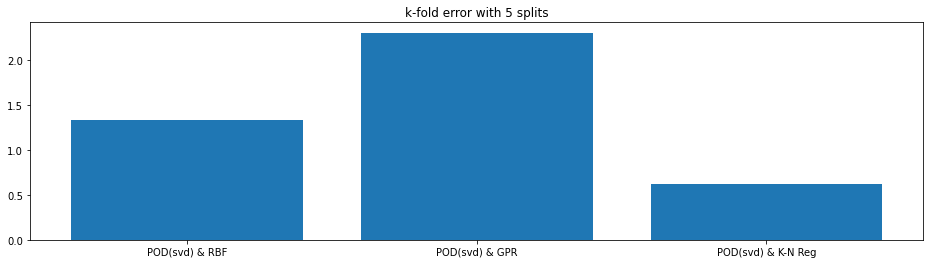

In [39]:
plt.figure(figsize=(16,4))
plt.title('k-fold error with 5 splits')
plt.bar(fig_title,errors_list)
plt.show()

Radius Neighbors Regressor vs Linear  interpolator

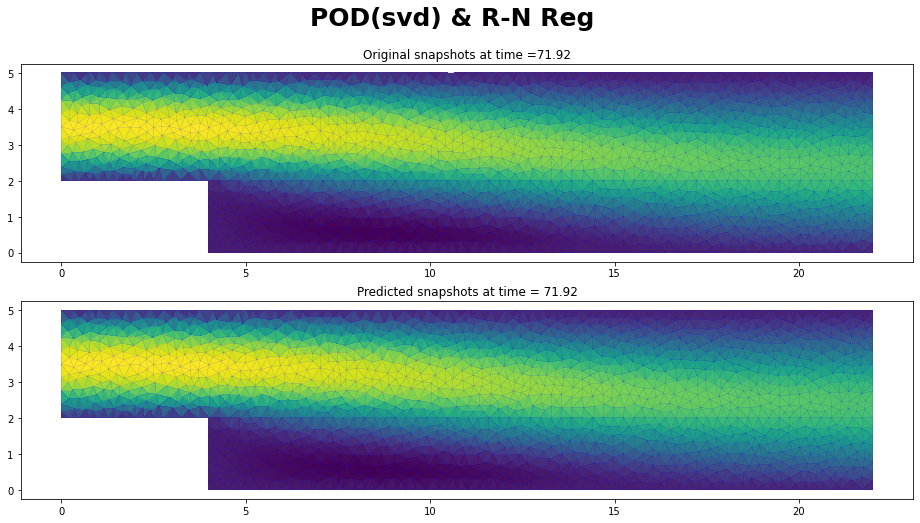

 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.
 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.
 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.
 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.
 C:\Users\Karim Yehia\anaconda3\lib\site-packages\sklearn\neighbors\_regression.py:470: UserWarning:One or more samples have no neighbors within specified radius; predicting NaN.


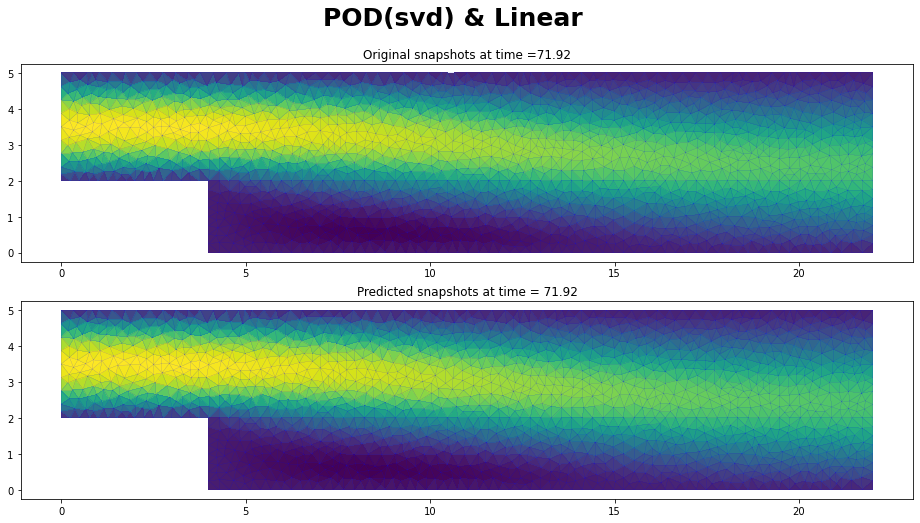

ValueError: A value in x_new is below the interpolation range.

In [40]:
# =======================================
# Variables declaration
errors_list = []
Approx_type = [RadiusNeighborsRegressor(), Linear()]
fig_title = ['POD(svd) & R-N Reg', 'POD(svd) & Linear']
fig_name = [i+'.png' for i in fig_title]
index = 450
# =======================================
for i in range(len(Approx_type)):
    # Step 5: Offline phase  
    db = Database(param, snapshots_vx)
    pod = POD('svd')   
    app = Approx_type[i]
    rom = ROM(db, pod, app)
    rom.fit()
    
    # Step 6: Online phase
    visual_test(triang, rom, index, fig_title[i], fig_name[i])
    
    # Step 7: Accuracy assessment
    errors = rom.kfold_cv_error(n_splits = 5)
    errors_list.append(errors.mean())

### RBF vs ANN

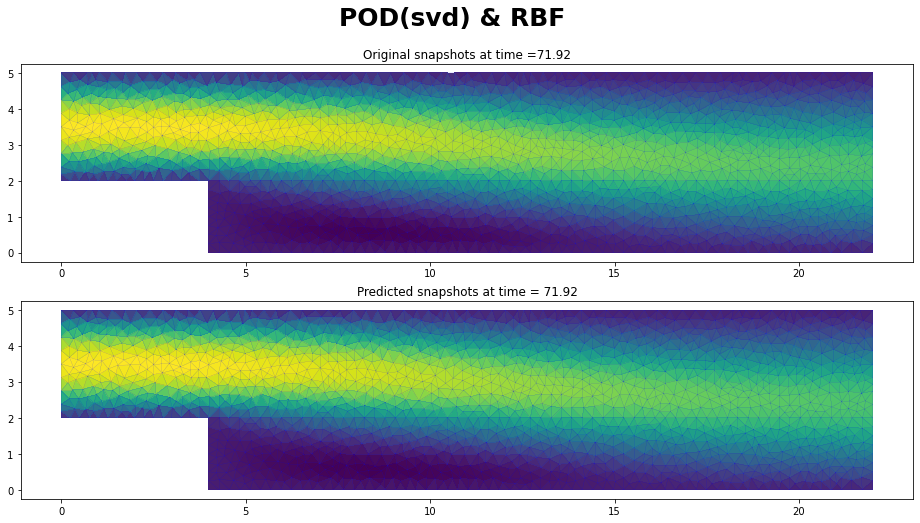

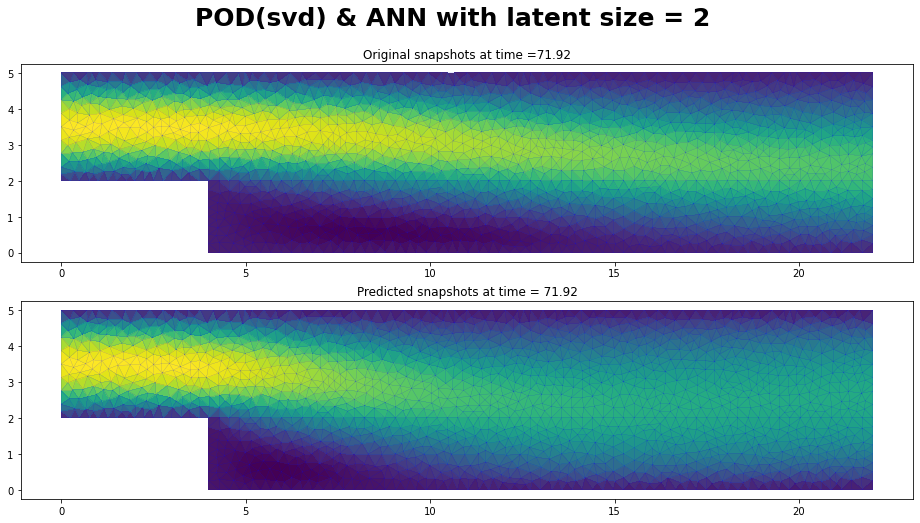

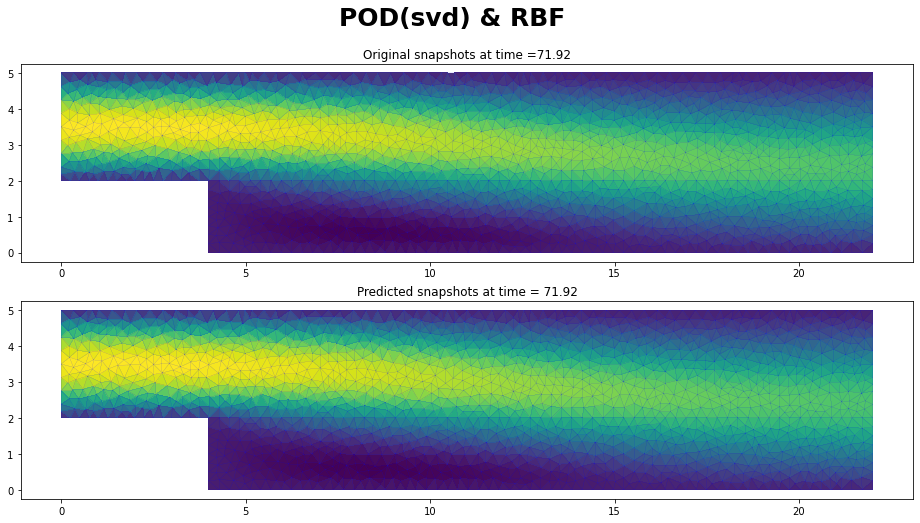

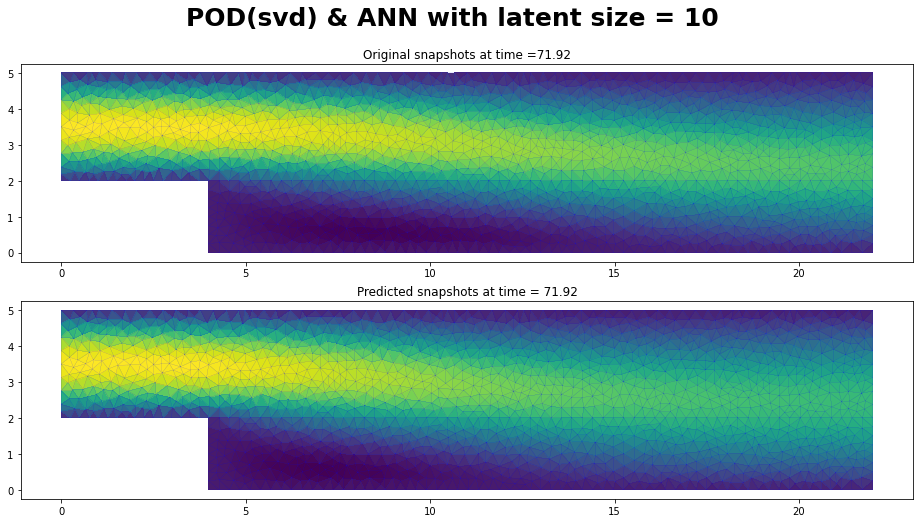

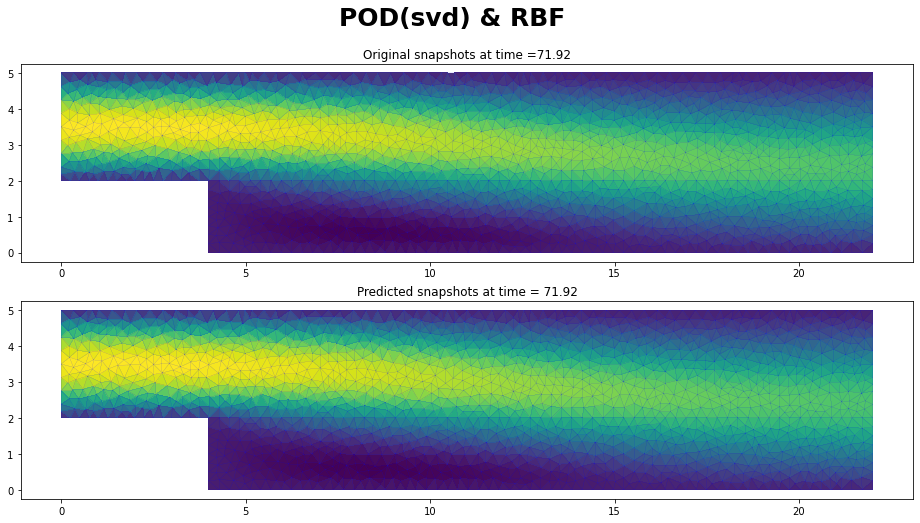

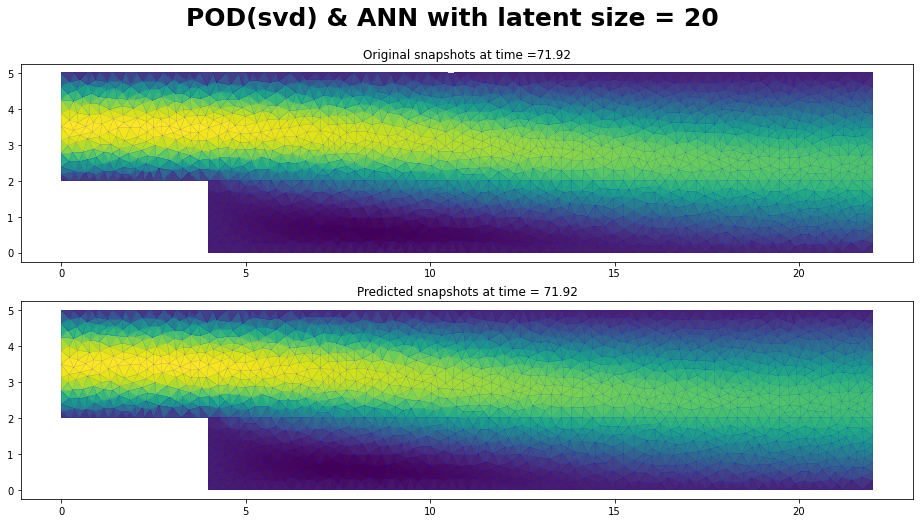

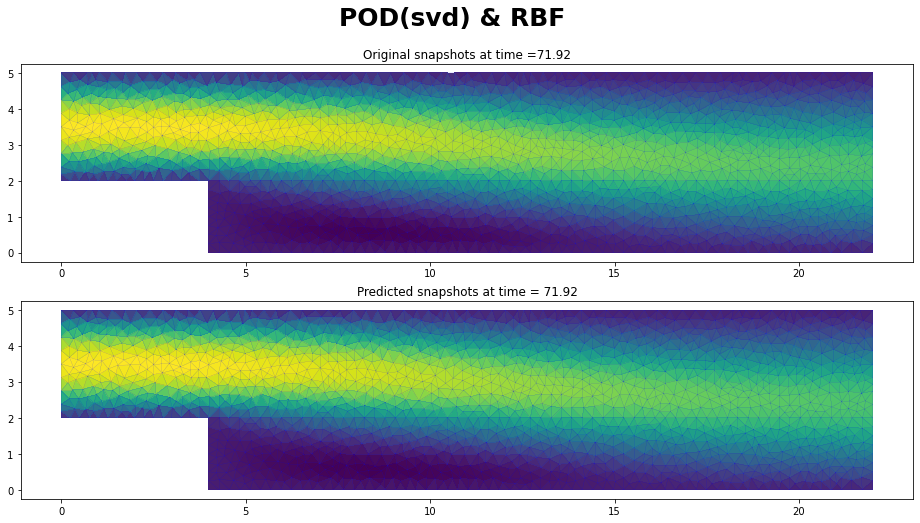

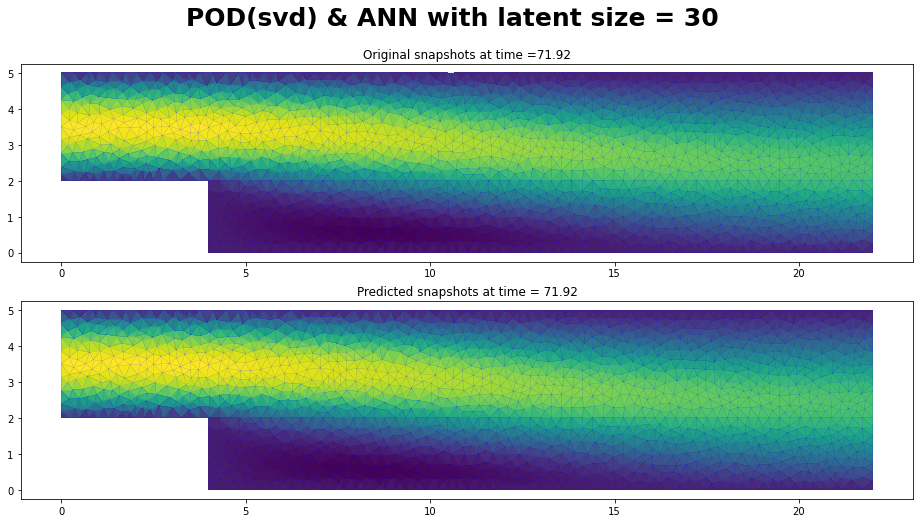

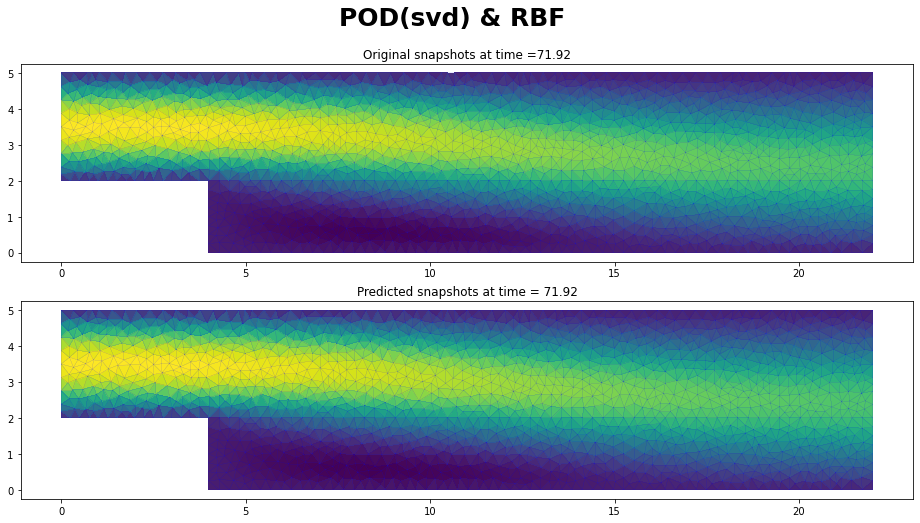

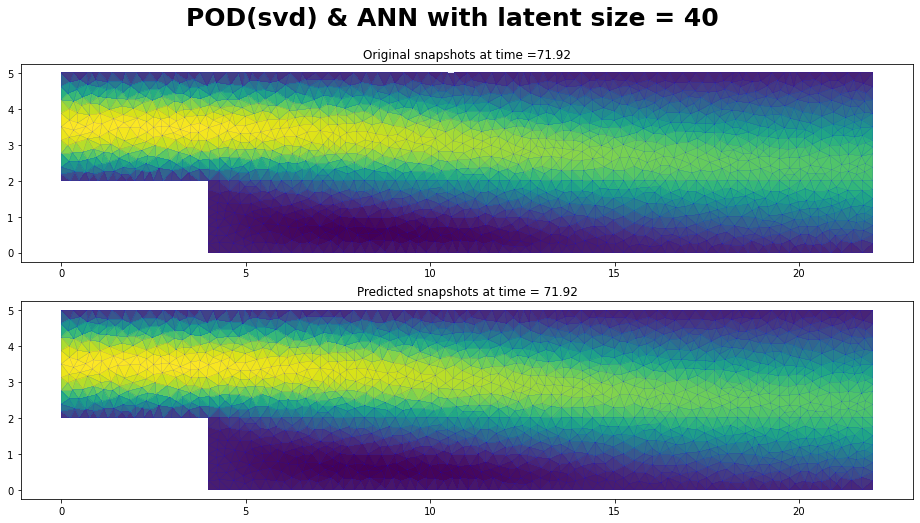

In [39]:
# =======================================
# Variables declaration
lv_dim = [2,10,20,30,40]
error_rbf = []
error_ann = []
# Remove a snapshot/parameter from the training set and use it for prediction
index = 450
snapshots_vx_train = np.delete(snapshots_vx, index, 0)
param_train = np.delete(param, index, 0)

# =======================================
for j in lv_dim:
    # Step 5: Offline phase  
    db = Database(param_train, snapshots_vx_train)
    
    pod = POD('svd')   

    rbf = RBF()
    ann = ANN([500, 100, j], nn.Tanh(), [40000,1e-5])
    
    rom_rbf = ROM(db, pod, rbf)
    rom_ann = ROM(db, pod, ann)

    rom_rbf.fit()
    rom_ann.fit()

    # Step 6: Online phase
    fig_title = ['POD(svd) & RBF', 'POD(svd) & ANN with latent size = {}'.format(j)]
    fig_name = ['POD(svd) & RBF_2.png', 'ANN_2 (latent size = {}).png'.format(j)]
    visual_test(triang, rom_rbf, index, fig_title[0], fig_name[0])
    visual_test(triang, rom_ann, index, fig_title[1], fig_name[1])

    # Step 7: Accuracy assessment (error for predicting the one removed snapshot)
    error_rbfi = np.linalg.norm(rom_rbf.predict(param[index])-snapshots_vx[index])/np.linalg.norm(snapshots_vx[index])
    error_anni = np.linalg.norm(rom_ann.predict(param[index])-snapshots_vx[index])/np.linalg.norm(snapshots_vx[index])
    error_rbf.append(error_rbfi)
    error_ann.append(error_anni)

error_rbf = np.array(error_rbf)
error_ann = np.array(error_ann)
np.save('error_rbf_1.npy',error_rbf)
np.save('error_ann_1.npy',error_ann)

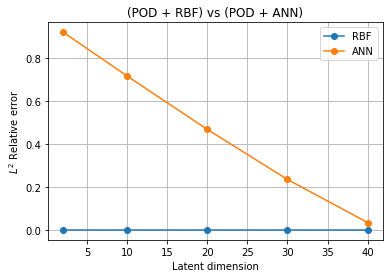

In [40]:
plt.plot(lv_dim, error_rbf,'-o', label = "RBF")
plt.plot(lv_dim, error_ann, '-o', label = "ANN")
plt.title('(POD + RBF) vs (POD + ANN)')
plt.xlabel('Latent dimension')
plt.ylabel('$L^{2}$ Relative error')
plt.legend()
plt.grid(True)
plt.savefig('(POD + RBF) vs (POD + ANN).png')
plt.show()

**Comment:** Increasing the number of training iterations or the number of neurons in the last hidden layer of the ANN decreases the the relative error.  